# Clustering

[Clustering](https://en.wikipedia.org/wiki/Cluster_analysis)([another link](https://www.geeksforgeeks.org/clustering-in-machine-learning/)) is basically a type of unsupervised learning method. An unsupervised learning method is a method in which we draw references from datasets consisting of input data without labelled responses. Generally, it is used as a process to find meaningful structure, explanatory underlying processes, generative features, and groupings inherent in a set of examples. We will use again
[scikit](https://scikit-learn.org/stable/auto_examples/cluster/plot_digits_linkage.html#sphx-glr-auto-examples-cluster-plot-digits-linkage-py)

In [9]:
# rdkit mols are displayed as images
from rdkit.Chem.Draw import IPythonConsole

from rdkit.Chem import AllChem as Chem
from rdkit import DataStructs

# descriptors
from rdkit.Chem import Lipinski
from rdkit.Chem import rdMolDescriptors
from rdkit.Chem import Descriptors

# diversity picker
from rdkit.SimDivFilters.rdSimDivPickers import MaxMinPicker

# plots
from matplotlib import pyplot
import seaborn

# scikit learn
# conda install -c conda-forge scikit-learn 
from scipy.spatial import distance
from sklearn import manifold
from sklearn import decomposition
from sklearn import preprocessing
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans

# other packages
import pandas as pd
import csv
import re

In [10]:
# some pChEMBL values in our file are not valid floats
float_pattern = re.compile("[0-9]+(\.[0-9]*)?")
# function for Lipinski's descriptors
lip_func = [("HBA", Lipinski.NumHAcceptors), ("HBD", Lipinski.NumHDonors), ("MW", Descriptors.ExactMolWt),
            ("LogP", Descriptors.MolLogP), ("TPSA", rdMolDescriptors.CalcTPSA), ("RB", Lipinski.NumRotatableBonds)]
# load mtor, we want to remember source of data and pChEMBLE value (it's transfomed compound activity to "standard" value)
with open("../../data/chembl_mtor_ic50.csv") as inp:
    mtor = [row for row in csv.DictReader(inp, delimiter=";", quotechar='"')]
    for m in mtor:
        m["rdmol"] = Chem.MolFromSmiles(m["Smiles"])
        m["source"] = "mtor"
        m["pChEMBL_value"] = float(m["pChEMBL Value"]) if float_pattern.match(m["pChEMBL Value"]) else 0
        m["fps"] = Chem.GetMorganFingerprintAsBitVect(m["rdmol"],2,nBits=1024)
        for f in lip_func:
            m[f[0]] = f[1](m["rdmol"])

<>:2: SyntaxWarning: invalid escape sequence '\.'
<>:2: SyntaxWarning: invalid escape sequence '\.'
C:\Users\marti\AppData\Local\Temp\ipykernel_13012\277778596.py:2: SyntaxWarning: invalid escape sequence '\.'
  float_pattern = re.compile("[0-9]+(\.[0-9]*)?")
[12:15:39] DEPRECATION WARNING: please use MorganGenerator
[12:15:39] DEPRECATION WARNING: please use MorganGenerator
[12:15:39] DEPRECATION WARNING: please use MorganGenerator
[12:15:39] DEPRECATION WARNING: please use MorganGenerator
[12:15:39] DEPRECATION WARNING: please use MorganGenerator
[12:15:39] DEPRECATION WARNING: please use MorganGenerator
[12:15:39] DEPRECATION WARNING: please use MorganGenerator
[12:15:39] DEPRECATION WARNING: please use MorganGenerator
[12:15:39] DEPRECATION WARNING: please use MorganGenerator
[12:15:39] DEPRECATION WARNING: please use MorganGenerator
[12:15:39] DEPRECATION WARNING: please use MorganGenerator
[12:15:39] DEPRECATION WARNING: please use MorganGenerator
[12:15:39] DEPRECATION WARNING: 

In [11]:
%%capture
# %%capture hides stderr (and maybe all output)
# same for drugbank
drugbank = [{"rdmol": m,
             "source": "drugbank",
             "Smiles": Chem.MolToSmiles(m),
             "pChEMBL_value": 0,
             "fps": Chem.GetMorganFingerprintAsBitVect(m, 2, nBits=1024),
             **{f[0]: f[1](m) for f in lip_func}
            } for m in Chem.SDMolSupplier("../../data/drugbank.sdf") if m
           ]

In [12]:
# let's work with Pandas dataframe
df = pd.DataFrame((*drugbank, *mtor), columns=["Smiles", "source", "rdmol", "fps", "pChEMBL_value", *(f[0] for f in lip_func)])
# adds index as normal column
df.reset_index(level=0, inplace=True)

In [13]:
df = df.join(pd.DataFrame((rdMolDescriptors.MQNs_(mol) for mol in df["rdmol"]),
                          columns=[*(f"MQN_{x}" for x in range(1,43))])
            )
df

,index,Smiles,source,rdmol,fps,pChEMBL_value,HBA,HBD,MW,LogP,...,MQN_33,MQN_34,MQN_35,MQN_36,MQN_37,MQN_38,MQN_39,MQN_40,MQN_41,MQN_42
0,0,CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x00000227822...,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.00,29,28,2178.985813,-8.11643,...,0,0,3,3,0,0,0,0,0,0
1,1,CC(C)C[C@H](NC(=O)[C@@H](COC(C)(C)C)NC(=O)[C@H...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x00000227822...,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.00,16,17,1268.641439,-3.10570,...,0,0,4,2,0,0,0,0,2,1
2,2,N=C(N)NCCC[C@H](NC(=O)[C@@H]1CCCN1C(=O)[C@@H]1...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x00000227822...,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, ...",0.00,15,14,1068.426955,-4.13203,...,0,0,1,2,0,0,0,1,0,0
3,3,CC(=O)N[C@H](Cc1ccc2ccccc2c1)C(=O)N[C@H](Cc1cc...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x00000227822...,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.00,16,17,1429.669818,-0.50613,...,0,0,1,5,0,0,0,0,2,1
4,4,C/C=C/C[C@@H](C)[C@@H](O)[C@H]1C(=O)N[C@@H](CC...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x00000227822...,"[0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, ...",0.00,12,5,1201.841368,3.26900,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11711,11711,COc1ncc(-c2ccc3nccc(=O)n3c2)cc1NS(=O)(=O)c1ccc...,mtor,<rdkit.Chem.rdchem.Mol object at 0x00000227822...,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...",0.00,7,1,426.079804,2.70500,...,0,0,0,4,0,0,0,0,2,1
11712,11712,O=c1ccnc2ccc(-c3cnc(Cl)c(NS(=O)(=O)c4ccc(F)cc4...,mtor,<rdkit.Chem.rdchem.Mol object at 0x00000227822...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.00,6,1,448.020845,3.48890,...,0,0,0,4,0,0,0,0,2,1
11713,11713,C=CC(=O)Nc1ccc(-n2c(=O)ccc3oc4ccc(-c5cccnc5)cc...,mtor,<rdkit.Chem.rdchem.Mol object at 0x00000227822...,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",6.64,5,1,407.126991,4.92340,...,0,0,1,4,0,0,0,0,4,2
11714,11714,COc1ccc(-c2ccc3c(N4CCOCC4)nc(CN)nc3n2)cc1CO,mtor,<rdkit.Chem.rdchem.Mol object at 0x00000227822...,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",6.84,8,2,381.180090,1.48800,...,0,0,0,4,0,0,0,0,2,1


In [14]:
norm = preprocessing.normalize(df[(f"MQN_{x}" for x in range(1, 43))])
pca = decomposition.PCA(n_components=42)
pca.fit(norm)
df = df.join(pd.DataFrame(pca.transform(norm), columns=[f"nPCA_{x}" for x in range(1, 43)]))

In [16]:
df.iloc[:,10:]

,TPSA,RB,MQN_1,MQN_2,MQN_3,MQN_4,MQN_5,MQN_6,MQN_7,MQN_8,...,nPCA_33,nPCA_34,nPCA_35,nPCA_36,nPCA_37,nPCA_38,nPCA_39,nPCA_40,nPCA_41,nPCA_42
0,901.57,66,98,0,0,0,0,0,0,21,...,-0.000615,-0.000527,-0.001670,0.000249,0.000192,-0.000022,0.000079,-5.008484e-05,0.000002,-0.000004
1,495.89,31,59,0,0,0,0,0,0,13,...,-0.000522,-0.000567,-0.001108,0.000340,-0.000239,0.000010,0.000132,-2.799292e-05,0.000002,-0.000007
2,435.41,19,46,0,0,0,0,2,0,8,...,0.005173,0.001715,-0.008404,0.005012,0.000313,-0.000829,0.000478,-1.823095e-03,-0.000065,-0.000054
3,495.67,38,70,0,1,0,0,0,0,15,...,-0.000143,0.000175,-0.001301,0.000313,0.000062,-0.000015,0.000136,-6.658015e-05,0.000003,-0.000005
4,278.80,15,62,0,0,0,0,0,0,0,...,0.006883,0.001129,-0.009004,0.005282,-0.000894,-0.003946,0.000420,-4.964222e-03,-0.000213,-0.000112
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11711,102.66,5,20,1,0,0,0,1,0,1,...,0.000061,-0.000335,-0.000537,0.000186,0.000147,-0.000061,0.000008,1.052031e-05,0.000001,-0.000002
11712,93.43,4,19,2,1,0,0,1,0,1,...,0.000215,0.001540,-0.000672,0.000182,0.000413,-0.000116,-0.000065,-3.597754e-07,0.000003,0.000002
11713,77.13,4,25,0,0,0,0,0,0,1,...,0.001005,-0.000645,-0.000702,-0.000293,0.000402,-0.000027,0.000061,-4.190107e-05,-0.000007,0.000005
11714,106.62,5,20,0,0,0,0,0,0,1,...,0.000151,-0.000664,0.000033,0.000138,0.000142,-0.000012,0.000092,-2.042800e-05,-0.000003,-0.000002


In [17]:
sparse_mat = distance.pdist(list(df["fps"]),metric="jaccard")
dist_mat = distance.squareform(sparse_mat)

In [18]:
clf = manifold.MDS(n_components=2, n_init=1, max_iter=100, dissimilarity="precomputed")
X_mds = clf.fit_transform(dist_mat)
df = df.join(pd.DataFrame(X_mds, columns=["mds_x","mds_y"]))

AttributeError: 'Series' object has no attribute 'flatten'

In [32]:
clf = manifold.TSNE(n_components=2, metric="precomputed", init="random")
X_tsne = clf.fit_transform(dist_mat)
df = df.join(pd.DataFrame(X_tsne, columns=["tsne_x_2", "tsne_y_2"]))

KeyboardInterrupt: 

## Hierarchical clustering
[Hierarchical clustering](https://en.wikipedia.org/wiki/Hierarchical_clustering)

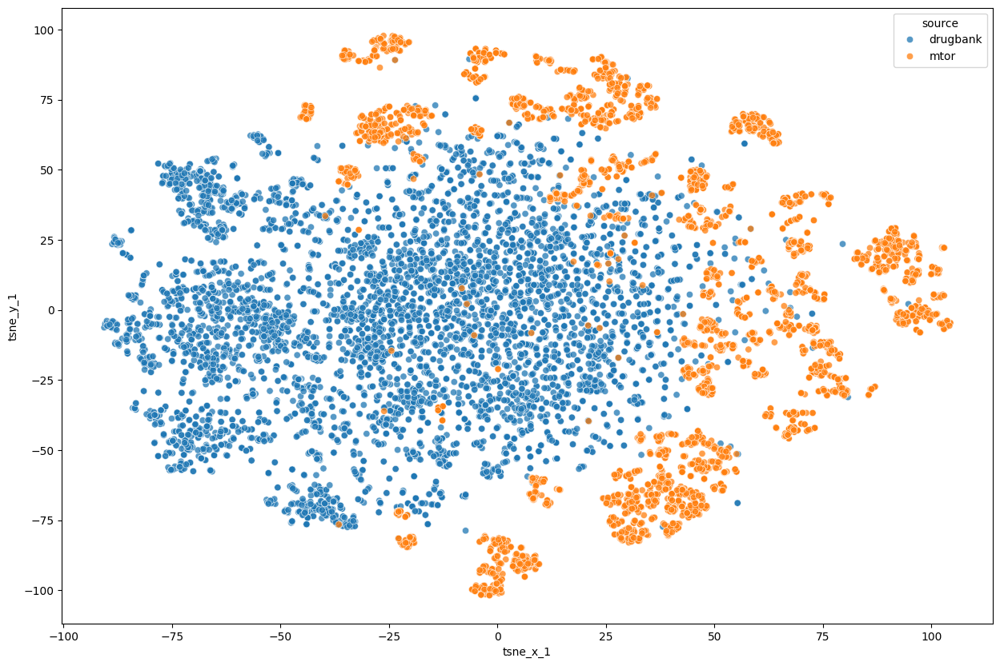

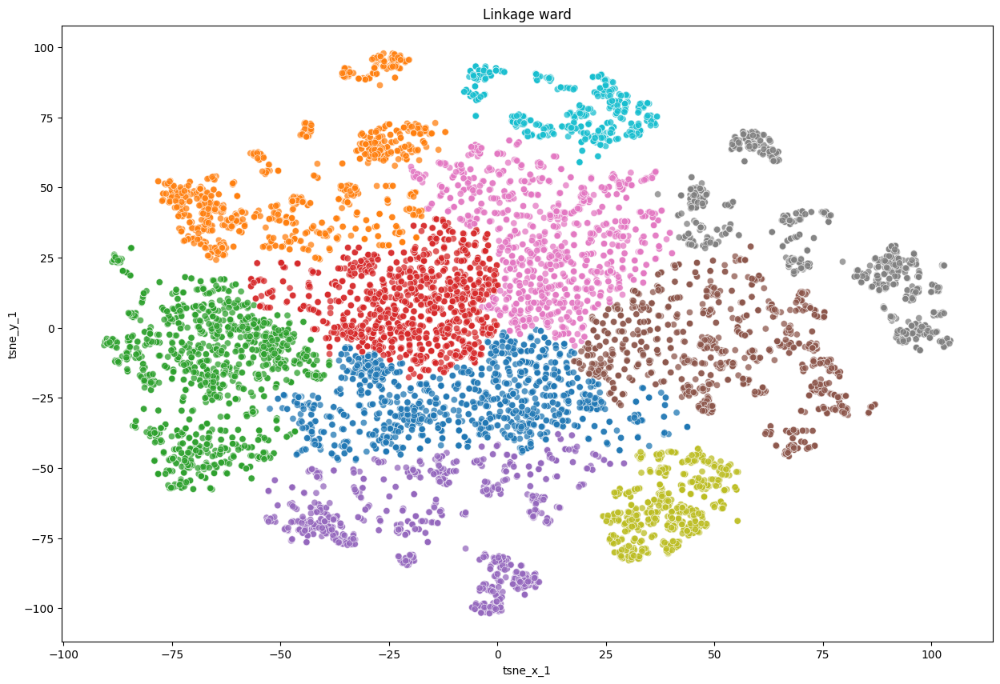

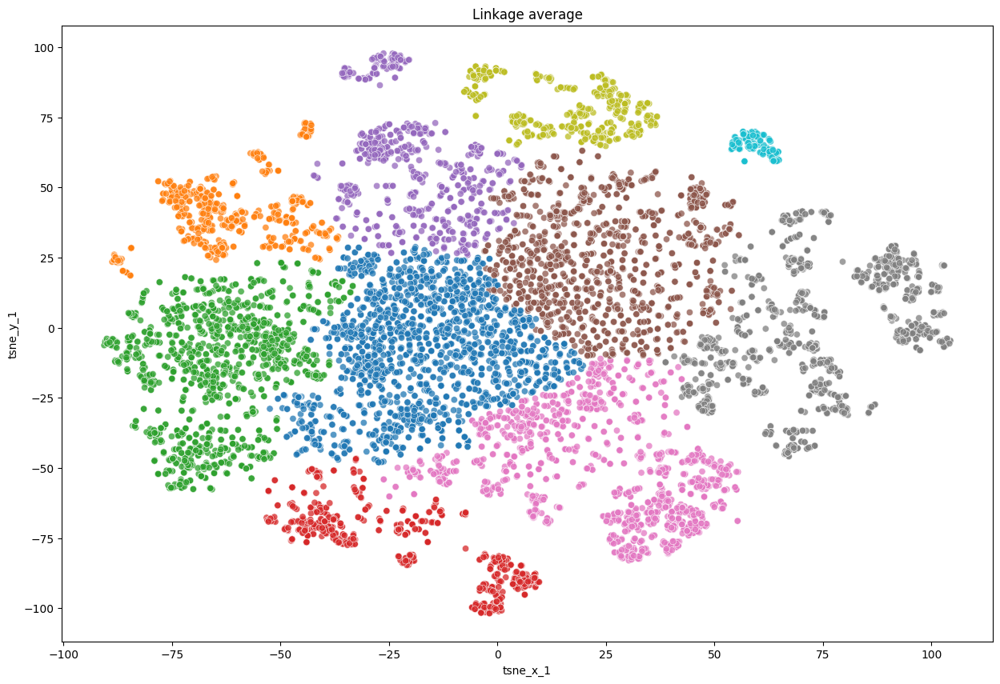

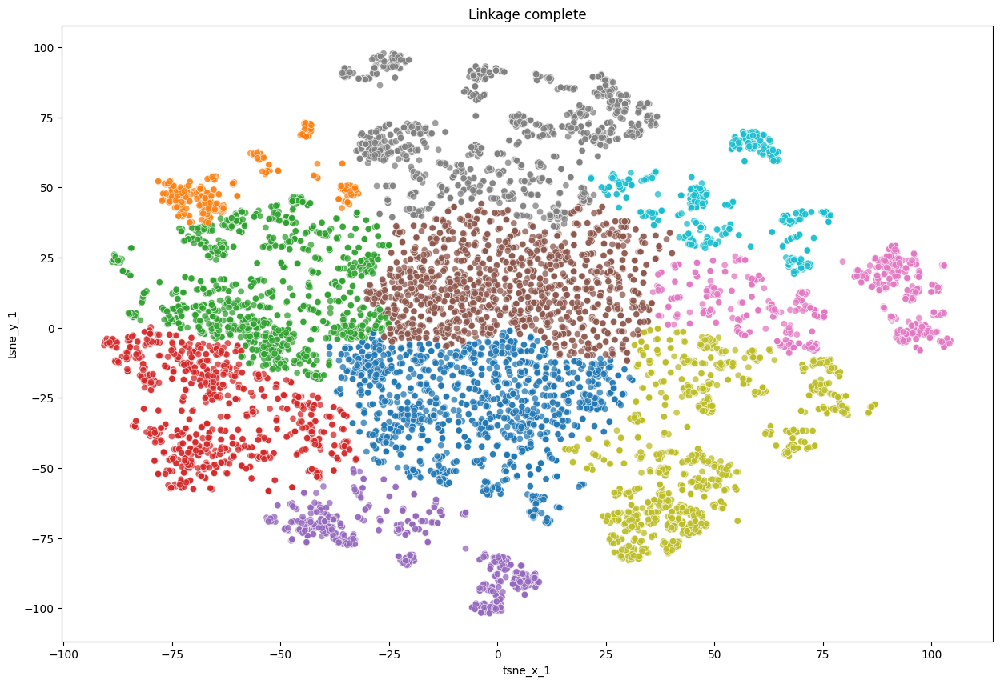

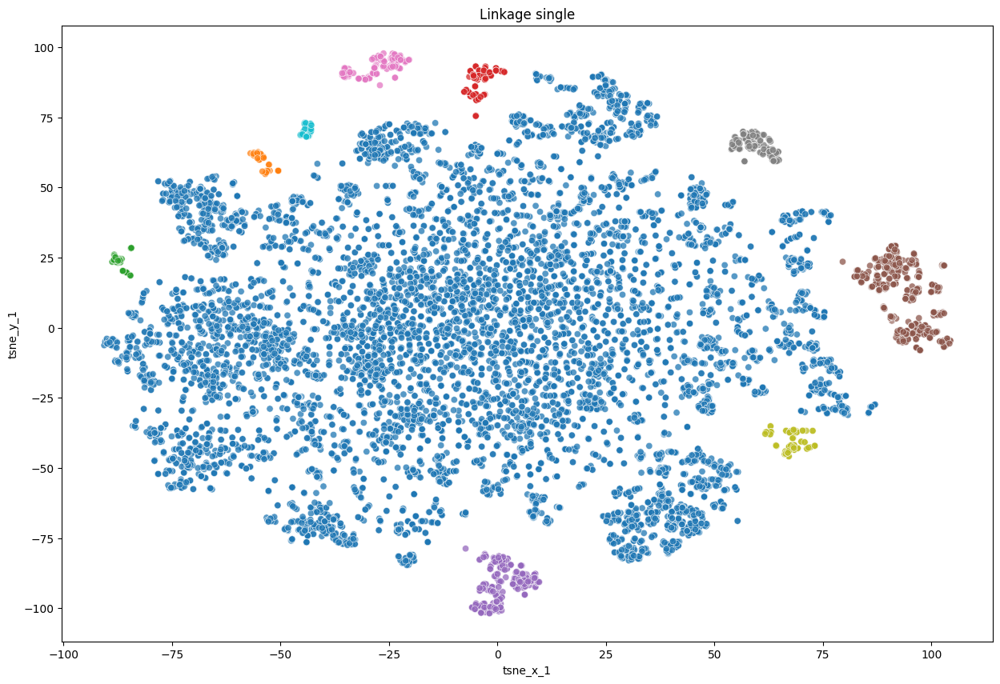

In [33]:
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="tsne_x_1",
                      y="tsne_y_1",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('ward', 'average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=10)
    clustering.fit(df[["tsne_x_1", "tsne_y_1"]])

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="tsne_x_1",
                      y="tsne_y_1",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / 10.) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False
                     ).set_title(f"Linkage {linkage}")


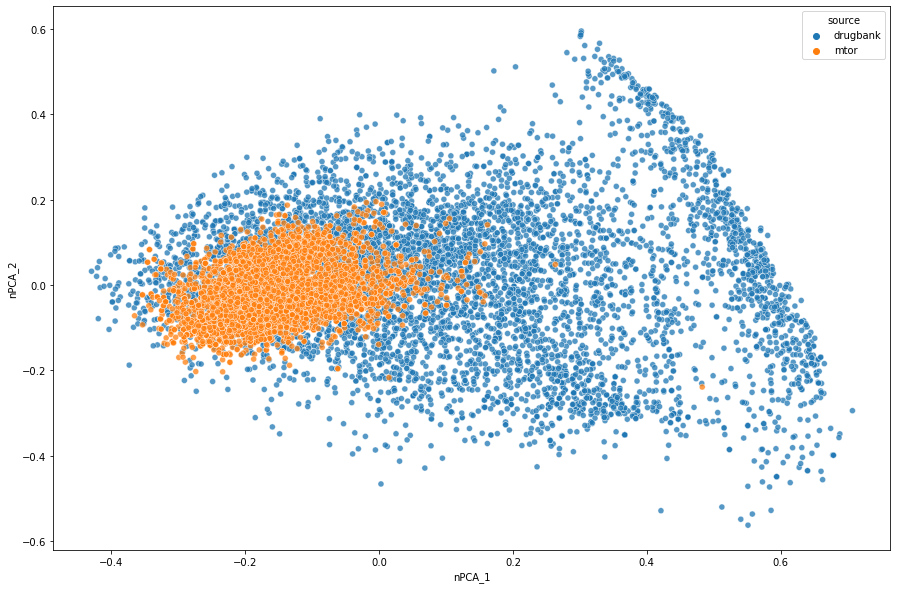

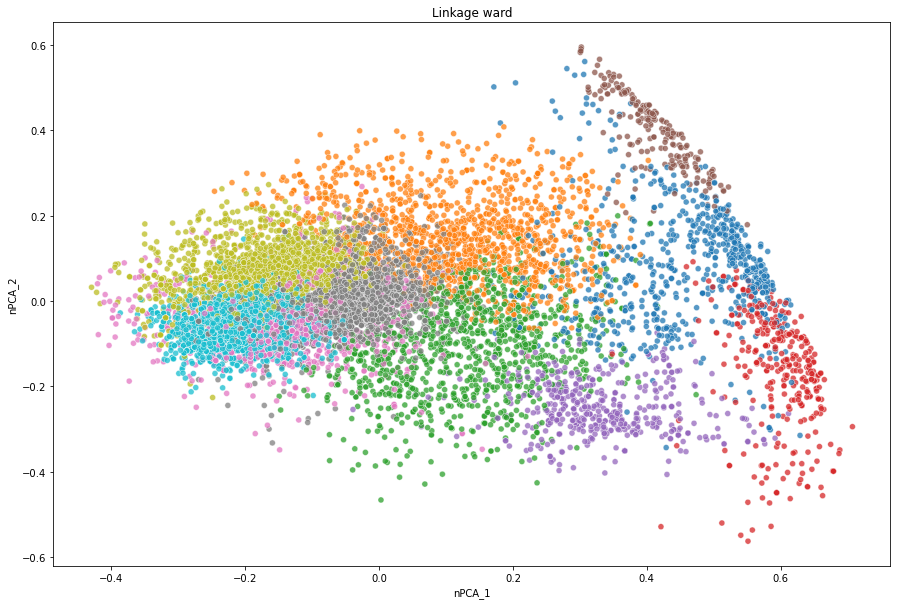

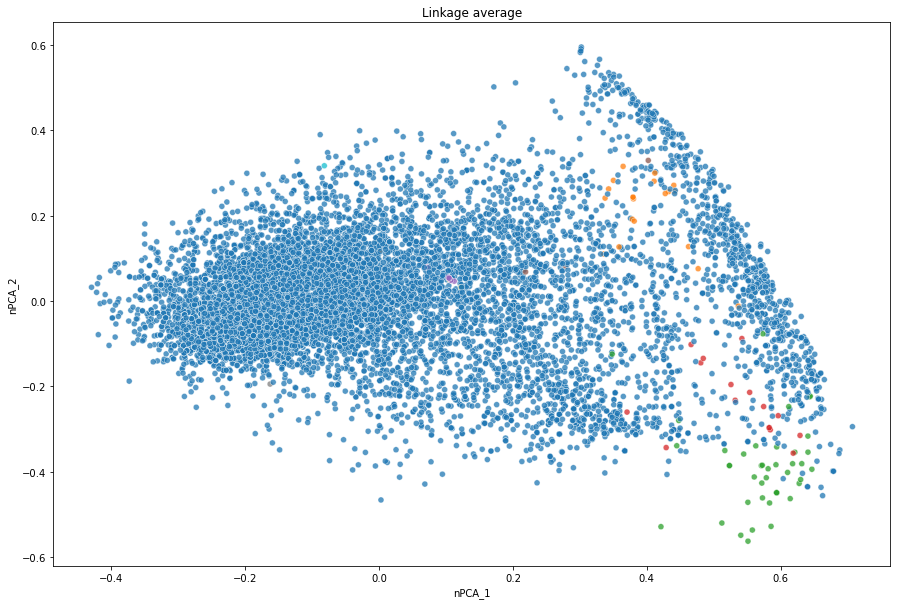

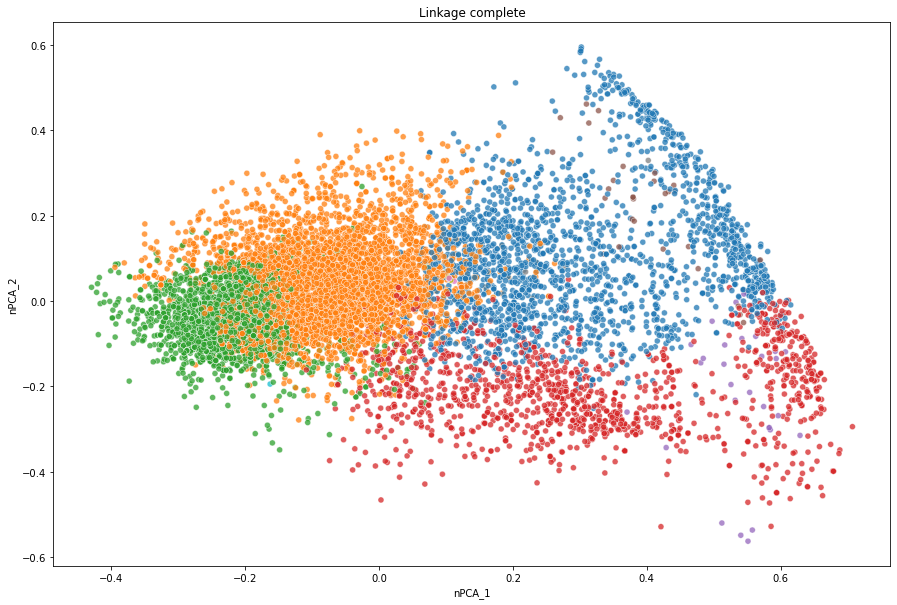

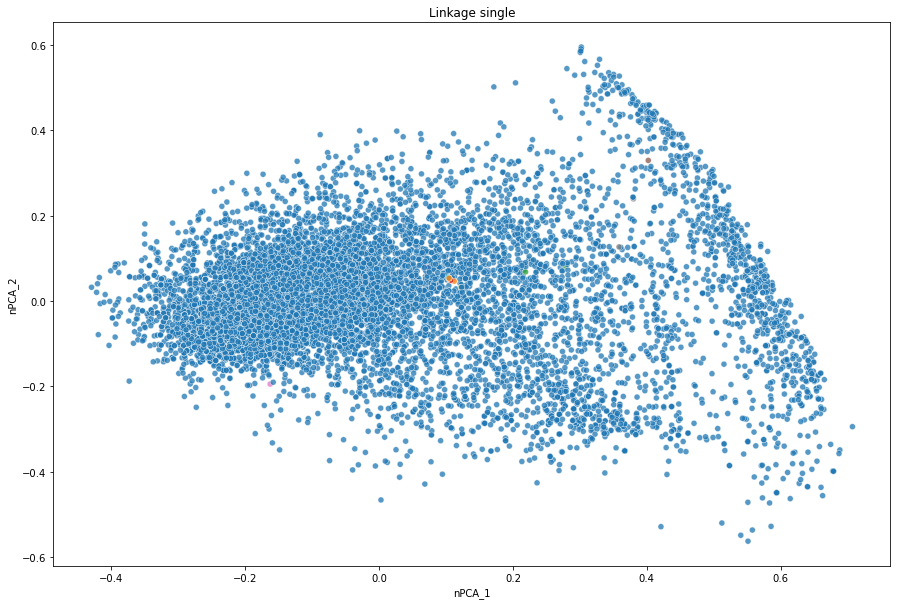

In [12]:
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="nPCA_1",
                      y="nPCA_2",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('ward', 'average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=10)
    clustering.fit(df[[f"nPCA_{x}" for x in range(1, 43)]])

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="nPCA_1",
                      y="nPCA_2",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / 10.) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False,
                     ).set_title(f"Linkage {linkage}")


## K-means clustering algorithm 
It is the simplest unsupervised learning algorithm that solves clustering problem. K-means algorithm partition n observations into k clusters where each observation belongs to the cluster with the nearest mean serving as a prototype of the cluster.

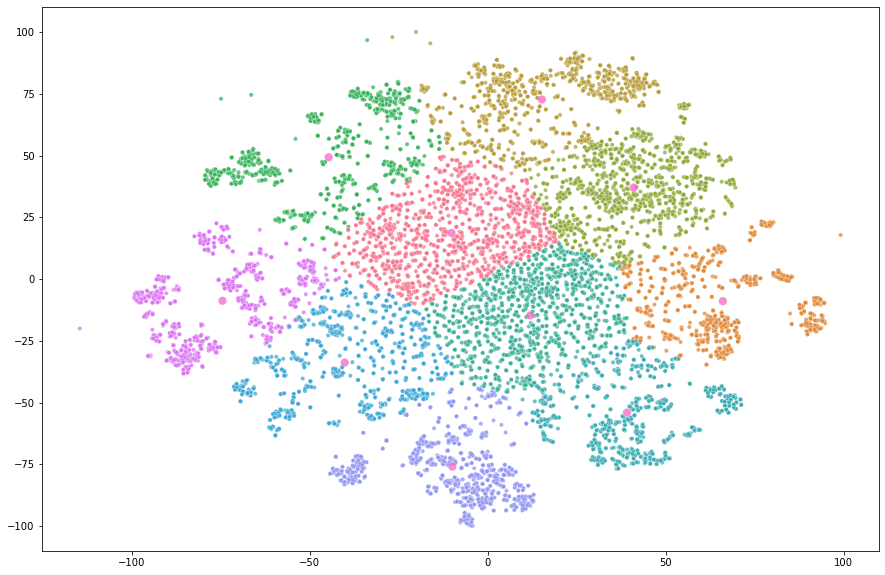

In [13]:
reduced_data = df[["tsne_x", "tsne_y"]]
n_clusters = 10
kmeans = KMeans(init="k-means++", n_clusters=n_clusters, n_init=4)
kmeans.fit(reduced_data)
centroids = kmeans.cluster_centers_
# Put the result into a color plot
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x= [*df["tsne_x"], *centroids[:, 0]],
                  y=[*df["tsne_y"], *centroids[:, 1]],
                  hue=[pyplot.cm.nipy_spectral(l / (n_clusters+1)) for l in (*kmeans.labels_, *(n_clusters for x in range(len(centroids))))],
                  size=[*[1 for l in kmeans.labels_],*[50 for x in range(len(centroids))]],
                  ax=ax,
                  alpha=0.75,
                  legend=False 
                 )



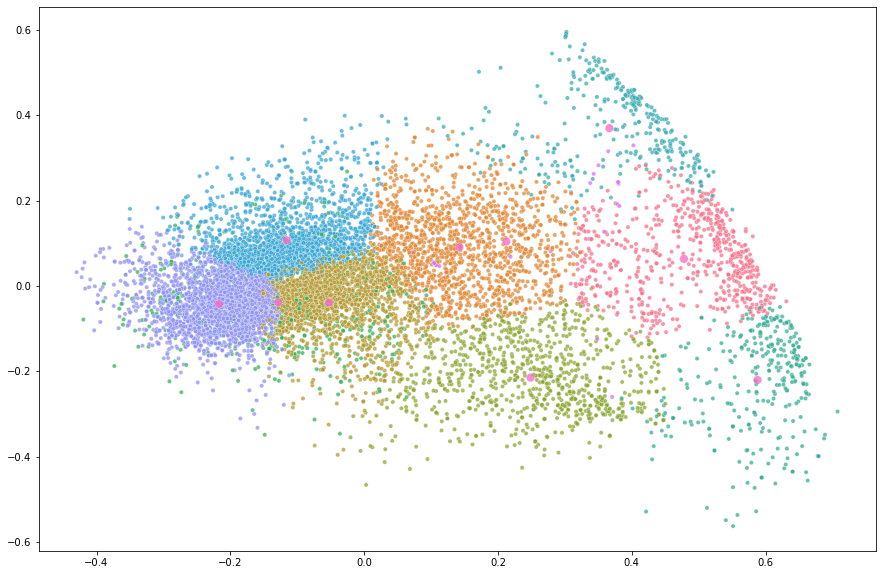

In [14]:
reduced_data = df[[f"nPCA_{x}" for x in range(1, 43)]]
n_clusters = 10
kmeans = KMeans(init="k-means++", n_clusters=n_clusters, n_init=4)
kmeans.fit(reduced_data)
centroids = kmeans.cluster_centers_

# Put the result into a color plot
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x= [*df["nPCA_1"], *centroids[:, 0]],
                  y=[*df["nPCA_2"], *centroids[:, 1]],
                  hue=[pyplot.cm.nipy_spectral(l / (n_clusters+3)) for l in (*kmeans.labels_, *(n_clusters for x in range(len(centroids))))],
                  size=[*[1 for l in kmeans.labels_],*[50 for x in range(len(centroids))]],
                  ax=ax,
                  alpha=0.75,
                  legend=False 
                 )

## How can we use clusters?
### Use case 1: Grouping
Clustering is often used to group similar instances or to find outliers.
### Use case 2: Classification
Clustering is unsupervised, however each cluster can get its own label/class. If clustering was performed on classed instances, each cluster can be labeled with the prevailing class inside this cluster.

## What to do
* Familiarize yourself with clustering methods. If mentioned methods in this exercise are not enough you can surely find more methods in scikit-learn. You can see that the methods work but you sometimes you don't get "desired" result.
* Try to find the "best" setting (algorithm, descriptors, metrics, linkage) where clusters have the highest [purity](https://en.wikipedia.org/wiki/Cluster_analysis#External_evaluation) (well, don't use the same number of clusters as compounds, try reasonable counts max 50 clusters)
* Try to classify your data e.g. to ligands and non-ligands (work with 20% of your data as you don't know their class, hint. this unknown data should be from both classes). How succesful is your classification? [Confusion matrix](https://en.wikipedia.org/wiki/Confusion_matrix) could help.

You can use precomputed distances, however be careful if it works.

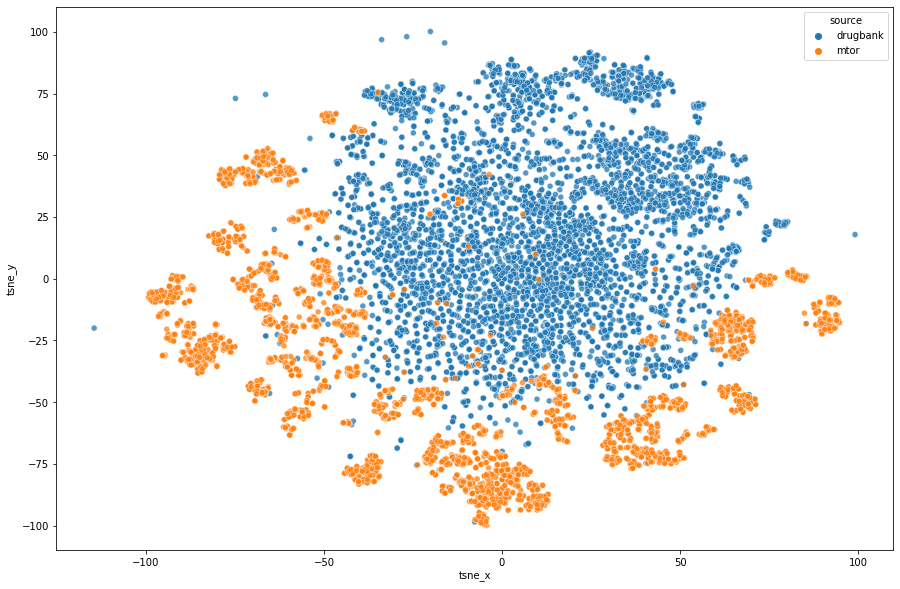

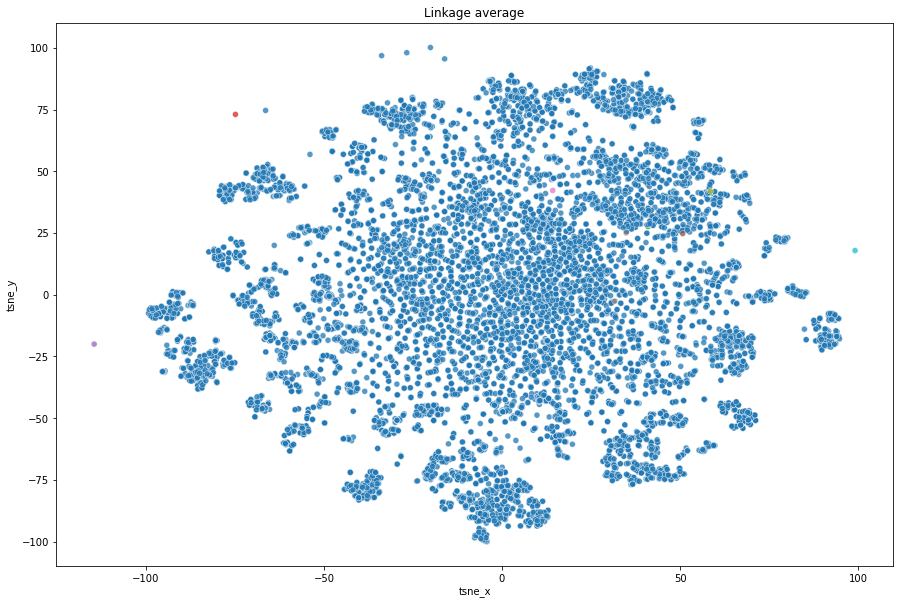

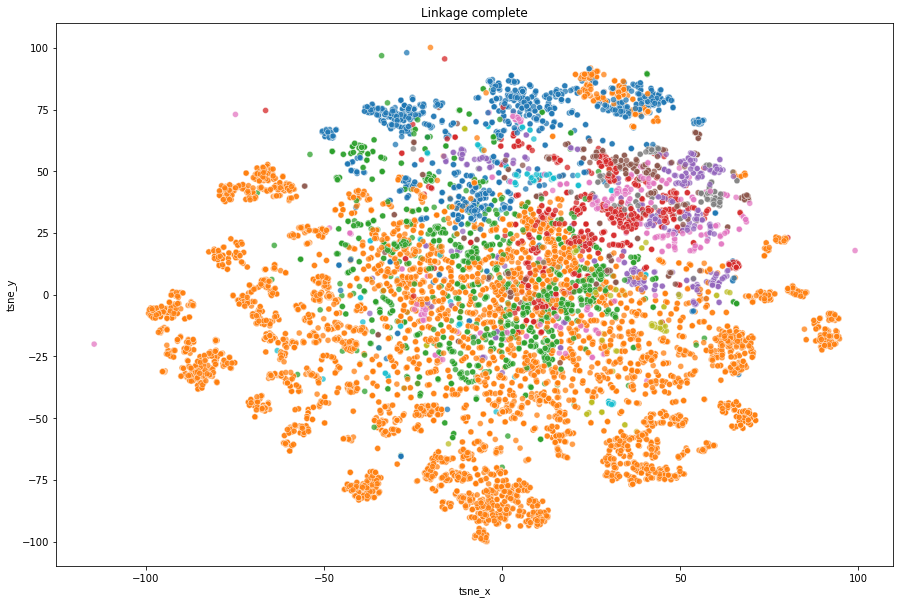

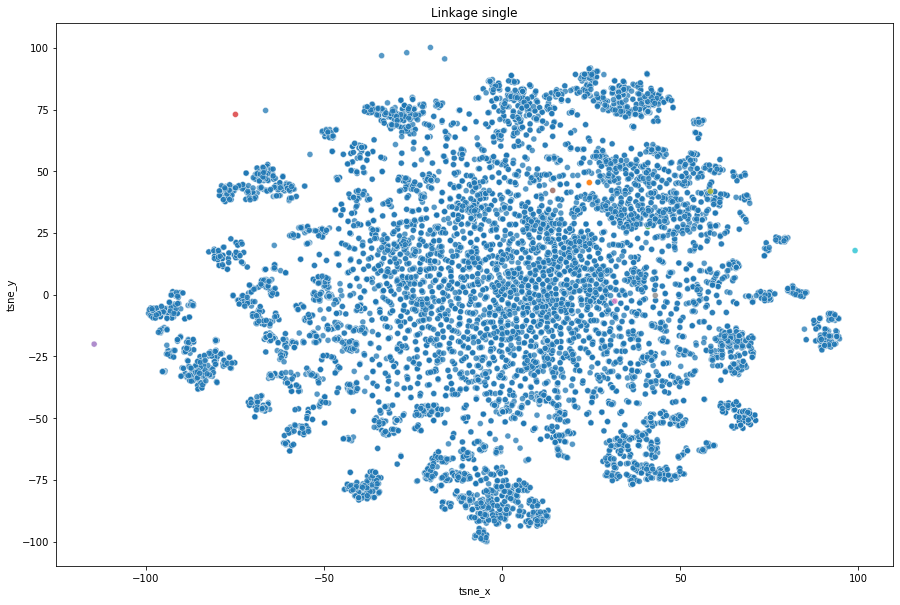

In [15]:
n_clusters = 10
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, affinity="precomputed", n_clusters=n_clusters)
    clustering.fit(dist_mat)

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / n_clusters) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False,
                     ).set_title(f"Linkage {linkage}")

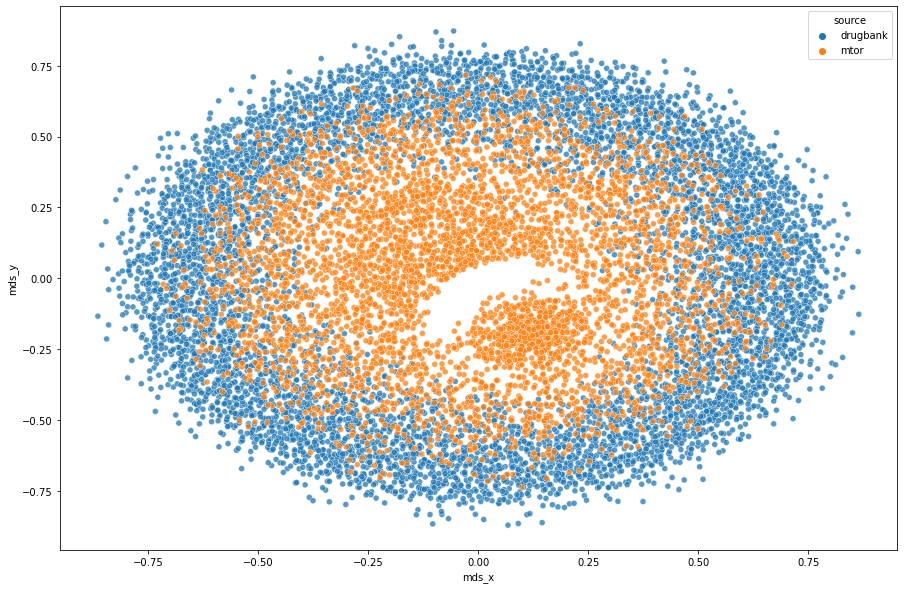

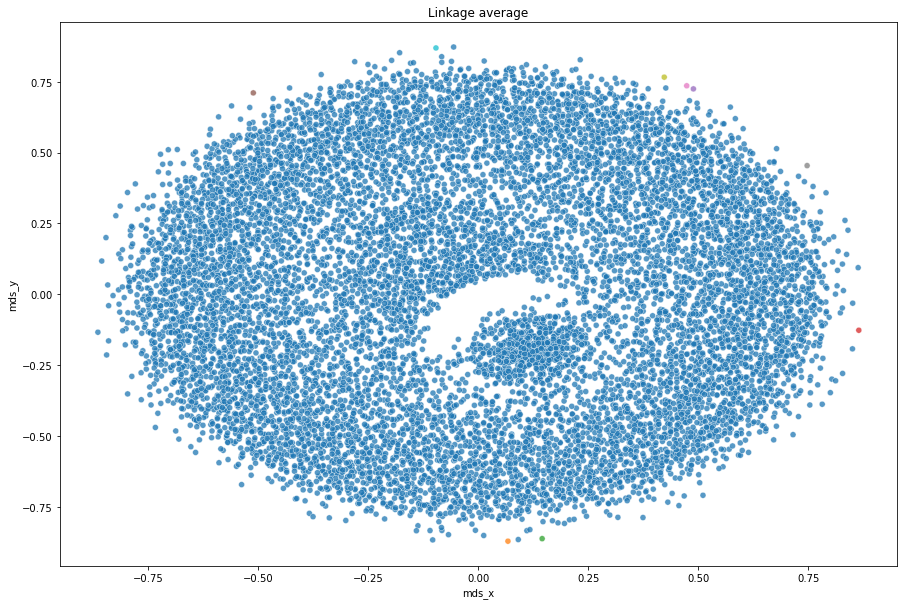

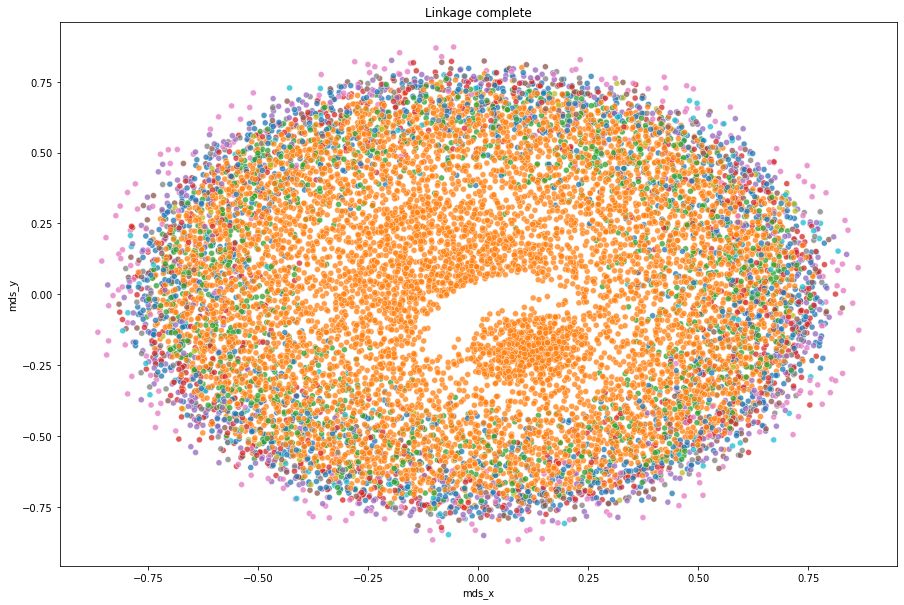

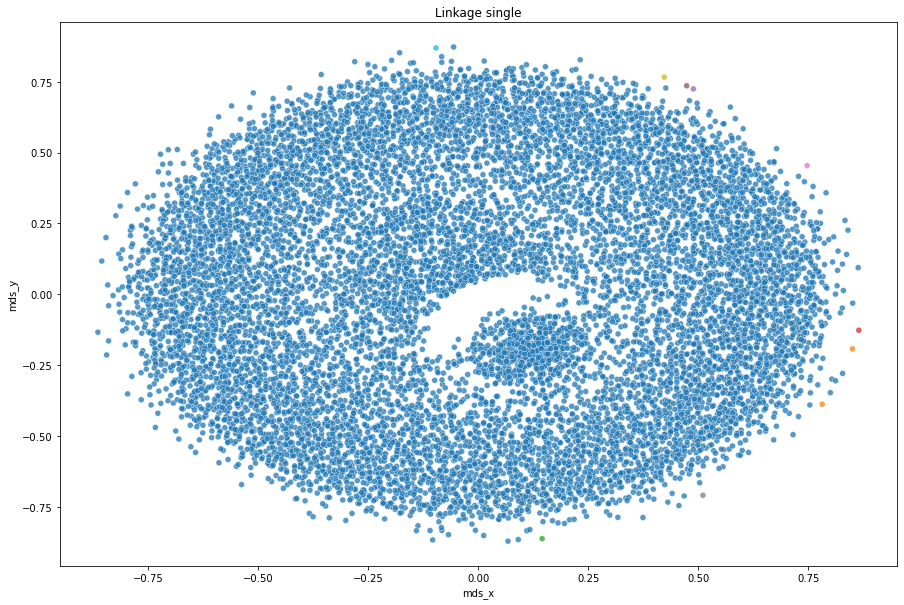

In [16]:
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="mds_x",
                      y="mds_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, affinity="precomputed", n_clusters=n_clusters)
    clustering.fit(dist_mat)

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="mds_x",
                      y="mds_y",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / n_clusters) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False,
                     ).set_title(f"Linkage {linkage}")